In [83]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from process_data import PreProcessData, PostProcessData

In [84]:
train = PreProcessData.train
test = PreProcessData.test

In [92]:
lgbm_sub = pd.read_csv('submission_20250128_au_forest.csv')

In [93]:
merged_test = pd.merge(test,lgbm_sub)

In [94]:
complete_df = pd.concat([train, merged_test]).reset_index(drop=True)

In [95]:
complete_df

,id,date,country,store,product,num_sold
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.00
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.00
3,3,2010-01-01,Canada,Discount Stickers,Kerneler,423.00
4,4,2010-01-01,Canada,Discount Stickers,Kerneler Dark Mode,491.00
...,...,...,...,...,...,...
328675,328675,2019-12-31,Singapore,Premium Sticker Mart,Holographic Goose,321.84
328676,328676,2019-12-31,Singapore,Premium Sticker Mart,Kaggle,1955.16
328677,328677,2019-12-31,Singapore,Premium Sticker Mart,Kaggle Tiers,1800.26
328678,328678,2019-12-31,Singapore,Premium Sticker Mart,Kerneler,970.66


In [96]:
def plot_individual_ts(df):
    colour_map = {"Canada": "blue", "Finland": "orange", "Italy": "green", "Kenya":"red", "Norway": "purple", "Singapore": "brown"}
    for country in df["country"].unique():
        f,axes = plt.subplots(df["store"].nunique()*df["product"].nunique(),figsize=(20,75))
        count = 0
        for store in df["store"].unique():
            for product in df["product"].unique():
                plot_df = df.loc[(df["product"] == product) & (df["country"] == country) & (df["store"] == store)]
                sns.lineplot(data = plot_df, x= "date", y="num_sold", linewidth=0.5, ax=axes[count], color=colour_map[country])
                axes[count].set_title(f"{country} - {store} - {product}")
                axes[count].axvline(pd.to_datetime("2017-01-01"), color='black', linestyle='--');
                count+=1

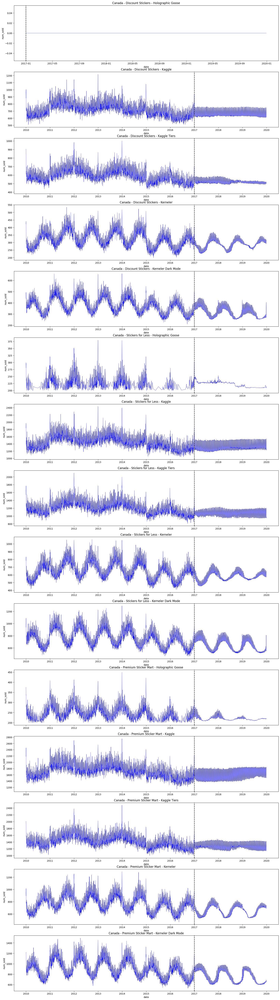

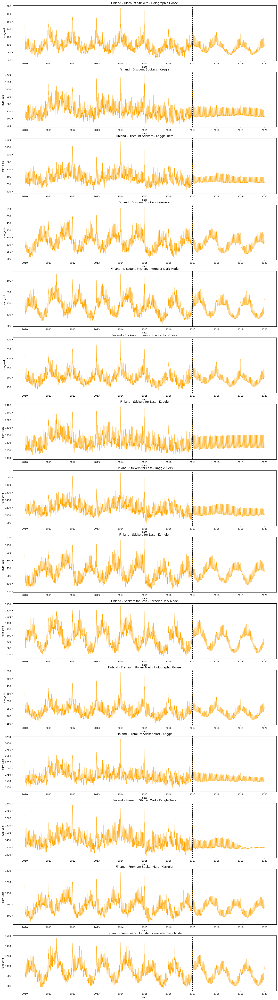

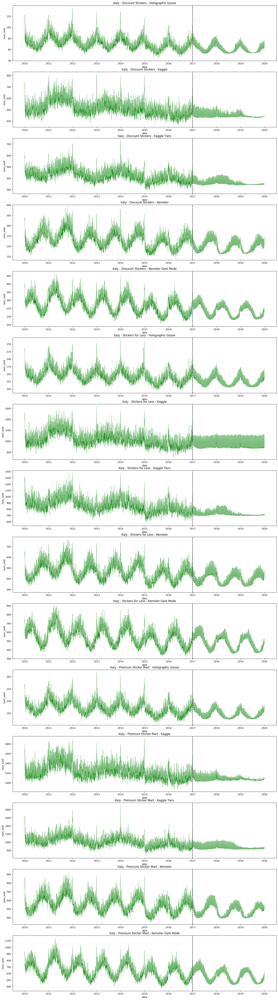

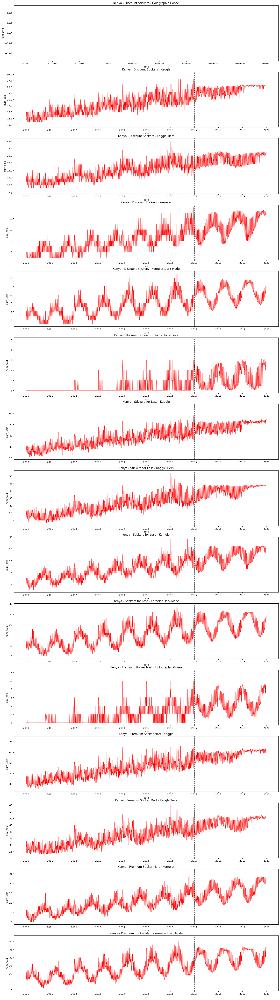

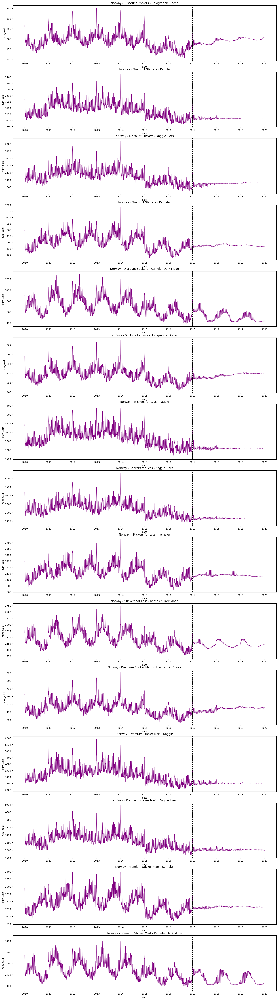

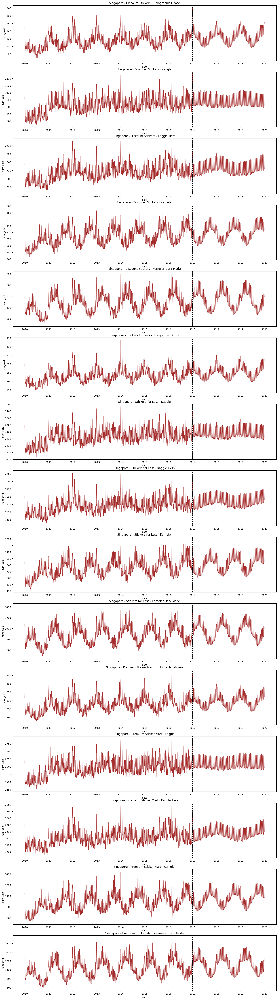

In [97]:
plot_individual_ts(complete_df)